In [16]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Load the maze
the_maze = np.load('D:\\MyFiles\\Courses\\Term5\\Neural Computation\\Project\\proj4\\CHW4_files\\maze.npy')
ny, nx = the_maze.shape

# Q-learning parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Decay per episode
epsilon_min = 0.01  # Minimum epsilon value
num_episodes = 5000  # Total training episodes

# Actions: Up, Right, Down, Left
actions = [(0, -1), (1, 0), (0, 1), (-1, 0)]
num_actions = len(actions)

# Q-table initialization (ny * nx, num_actions)
Q_table = np.zeros((ny, nx, num_actions))

def get_valid_actions(x, y):
    """Returns a list of valid actions for a given state."""
    valid_actions = []
    for i, (dx, dy) in enumerate(actions):
        nx_, ny_ = x + dx, y + dy
        if 0 <= nx_ < nx and 0 <= ny_ < ny and the_maze[ny_][nx_] == 0:
            valid_actions.append(i)
    return valid_actions

def choose_action(x, y):
    """Epsilon-greedy policy."""
    if random.uniform(0, 1) < epsilon:
        return random.choice(get_valid_actions(x, y))  # Explore
    else:
        valid_actions = get_valid_actions(x, y)
        return max(valid_actions, key=lambda a: Q_table[y, x, a])  # Exploit

def train_agent():
    global epsilon
    for episode in range(num_episodes):
        x, y = 0, 0  # Start position
        total_reward = 0

        while (x, y) != (nx - 1, ny - 1):  # Until reaching the goal
            action = choose_action(x, y)
            dx, dy = actions[action]
            new_x, new_y = x + dx, y + dy
            
            # Reward system
            if (new_x, new_y) == (nx - 1, ny - 1):
                reward = 100  # Big reward for reaching the goal
            else:
                reward = -1  # Small penalty for each step
            
            # Q-value update
            best_next_action = max(get_valid_actions(new_x, new_y), key=lambda a: Q_table[new_y, new_x, a])
            Q_table[y, x, action] += alpha * (reward + gamma * Q_table[new_y, new_x, best_next_action] - Q_table[y, x, action])
            
            x, y = new_x, new_y
            total_reward += reward

        # Decay epsilon
        epsilon = max(epsilon * epsilon_decay, epsilon_min)
        
        if episode % 500 == 0:
            print(f"Episode {episode}, Total Reward: {total_reward}, Epsilon: {epsilon:.3f}")

def solve_maze():
    """Use the trained Q-table to solve the maze."""
    x, y = 0, 0
    path = [(x, y)]
    while (x, y) != (nx - 1, ny - 1):
        action = max(get_valid_actions(x, y), key=lambda a: Q_table[y, x, a])
        dx, dy = actions[action]
        x, y = x + dx, y + dy
        path.append((x, y))
    return path




In [17]:
'''# Train and solve
train_agent()
solution_path = solve_maze()

# Visualize
maze_display = np.copy(the_maze)
for (x, y) in solution_path:
    maze_display[y, x] = 0.5
plt.imshow(maze_display, cmap='gray')
plt.show()

def draw_optimal_path(path):
    """Draws the maze with the optimal path overlaid."""
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(the_maze, cmap="gray")

    # Extract X and Y coordinates from path
    x_coords, y_coords = zip(*path)

    # Plot the path with red line
    ax.plot(x_coords, y_coords, color='red', linewidth=2, marker='o', markersize=4, label="Optimal Path")

    # Mark start and goal positions
    ax.scatter([0], [0], color='green', s=100, label="Start (0,0)")
    ax.scatter([nx - 1], [ny - 1], color='blue', s=100, label="Goal (nx-1,ny-1)")

    ax.legend()
    plt.title("Optimal Path in the Maze")
    plt.show()

# Call function to display the optimal path
draw_optimal_path(solution_path)'''

'# Train and solve\ntrain_agent()\nsolution_path = solve_maze()\n\n# Visualize\nmaze_display = np.copy(the_maze)\nfor (x, y) in solution_path:\n    maze_display[y, x] = 0.5\nplt.imshow(maze_display, cmap=\'gray\')\nplt.show()\n\ndef draw_optimal_path(path):\n    """Draws the maze with the optimal path overlaid."""\n    fig, ax = plt.subplots(figsize=(10, 10))\n    ax.imshow(the_maze, cmap="gray")\n\n    # Extract X and Y coordinates from path\n    x_coords, y_coords = zip(*path)\n\n    # Plot the path with red line\n    ax.plot(x_coords, y_coords, color=\'red\', linewidth=2, marker=\'o\', markersize=4, label="Optimal Path")\n\n    # Mark start and goal positions\n    ax.scatter([0], [0], color=\'green\', s=100, label="Start (0,0)")\n    ax.scatter([nx - 1], [ny - 1], color=\'blue\', s=100, label="Goal (nx-1,ny-1)")\n\n    ax.legend()\n    plt.title("Optimal Path in the Maze")\n    plt.show()\n\n# Call function to display the optimal path\ndraw_optimal_path(solution_path)'

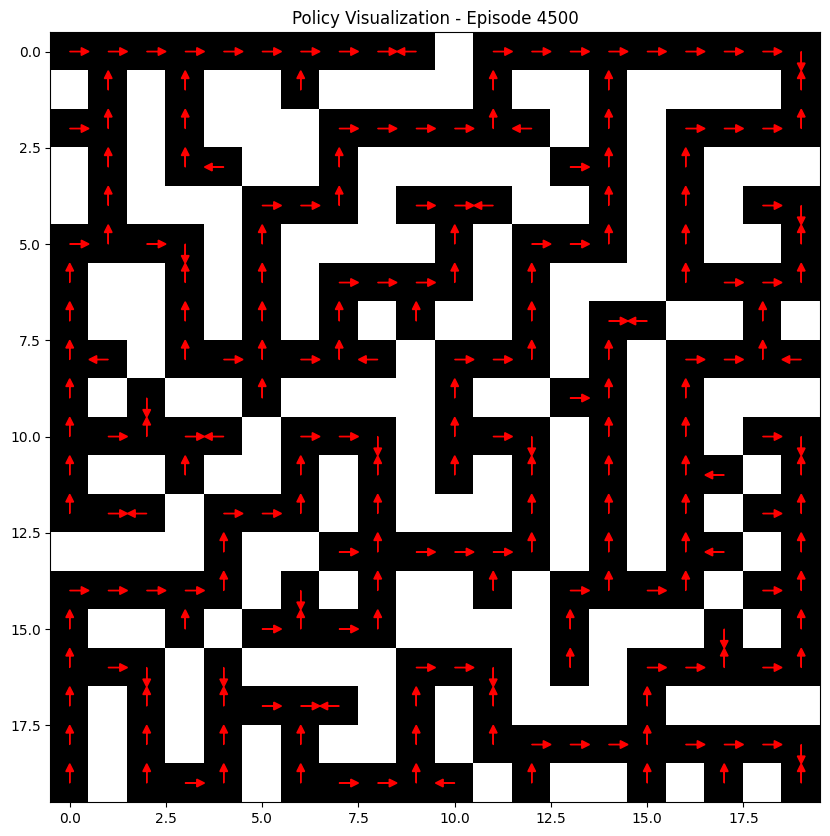

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import imageio

# Define arrow directions for visualization
arrow_map = {
    0: (0, -1),   # Up
    1: (1, 0),    # Right
    2: (0, 1),    # Down
    3: (-1, 0)    # Left
}

def draw_policy(Q_table, episode, save_path=None):
    """Visualizes the best policy at each cell using arrows, ensuring arrows do not point to walls."""
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(the_maze, cmap="gray")  # Show maze

    for y in range(ny):
        for x in range(nx):
            if the_maze[y, x] == 0:  # Ignore walls
                # Get valid actions for the current cell (excluding walls)
                valid_actions = get_valid_actions(x, y)
                
                if valid_actions:  # If there are valid actions
                    # Find the best action among valid actions
                    best_action = max(valid_actions, key=lambda a: Q_table[y, x, a])
                    dx, dy = arrow_map[best_action]
                    
                    # Draw the arrow
                    ax.arrow(x, y, dx * 0.3, dy * 0.3, head_width=0.2, head_length=0.2, fc='red', ec='red')

    ax.set_title(f"Policy Visualization - Episode {episode}")
    if save_path:
        plt.savefig(save_path)
    plt.show()

draw_policy(Q_table,4500)

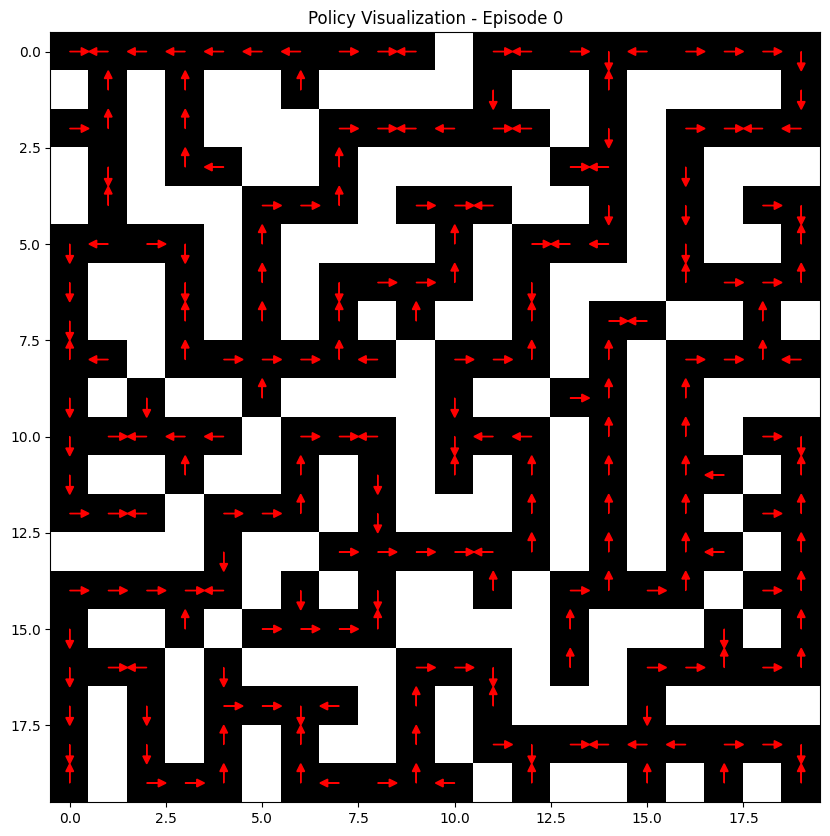

C:\Users\Reza\AppData\Local\Temp\ipykernel_12480\3093078689.py:34: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(save_path))  # Store frame


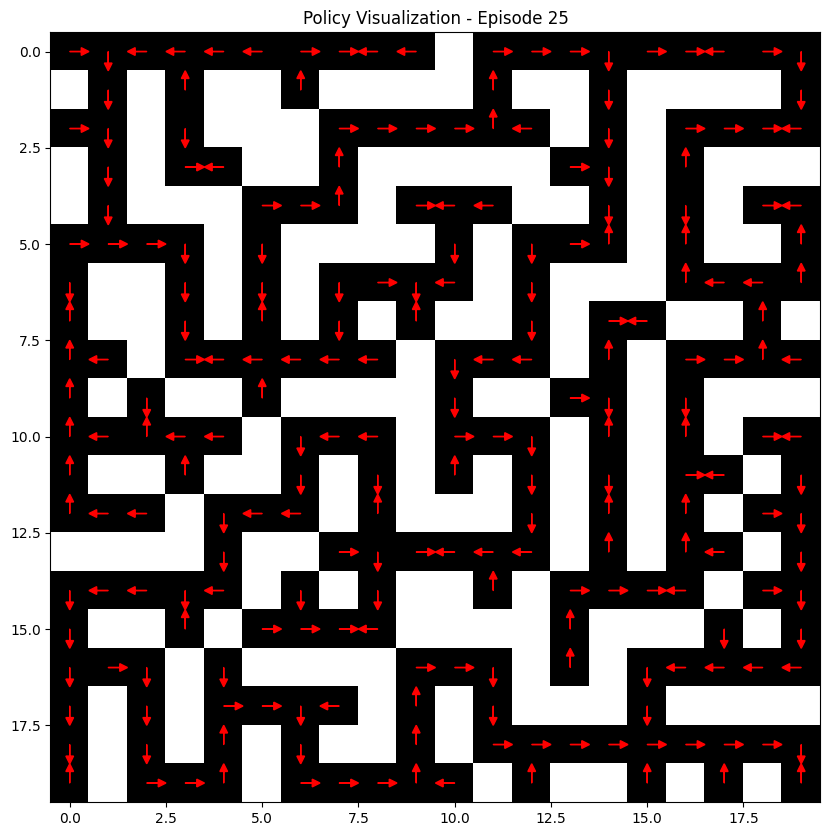

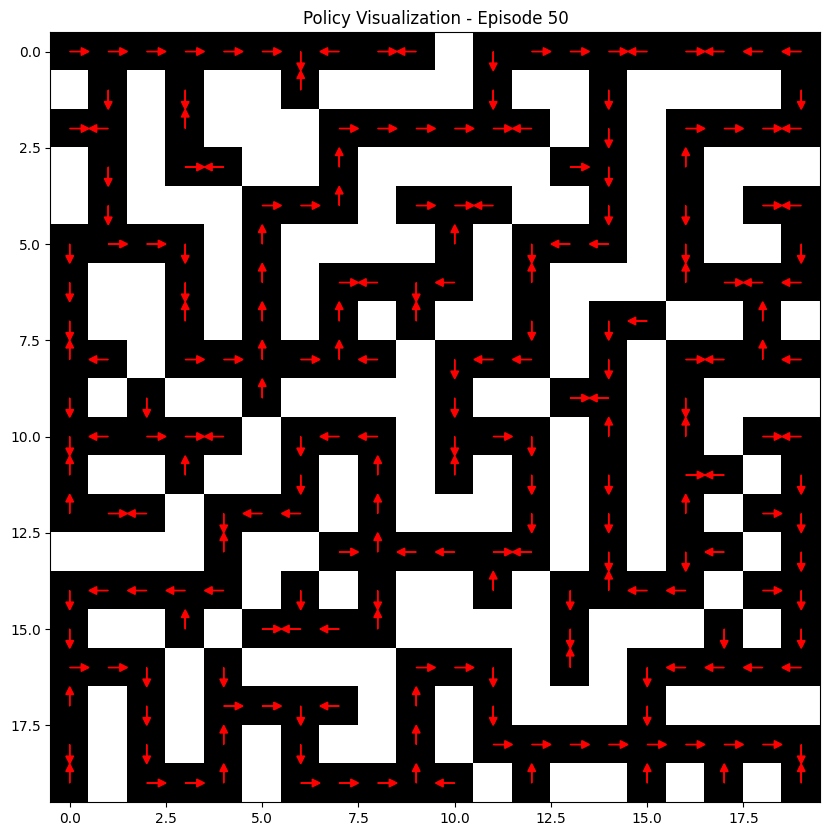

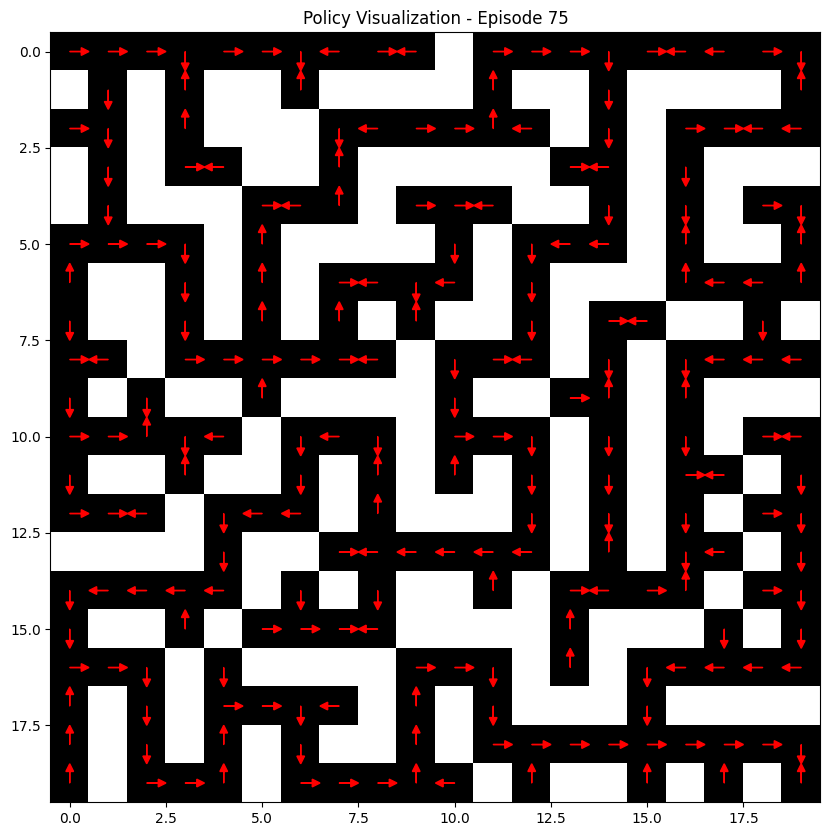

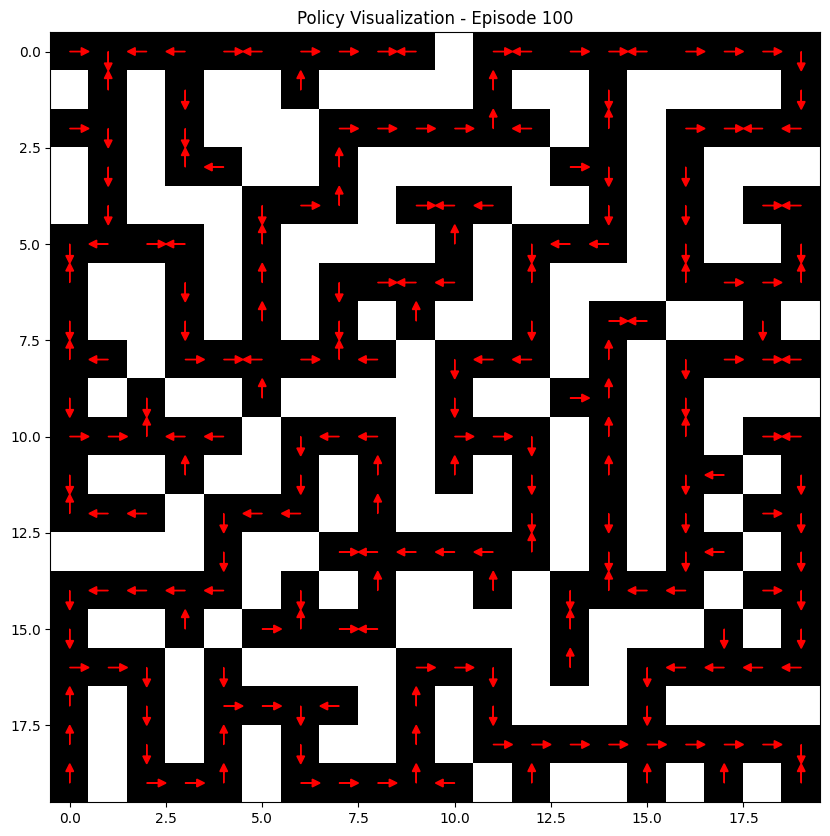

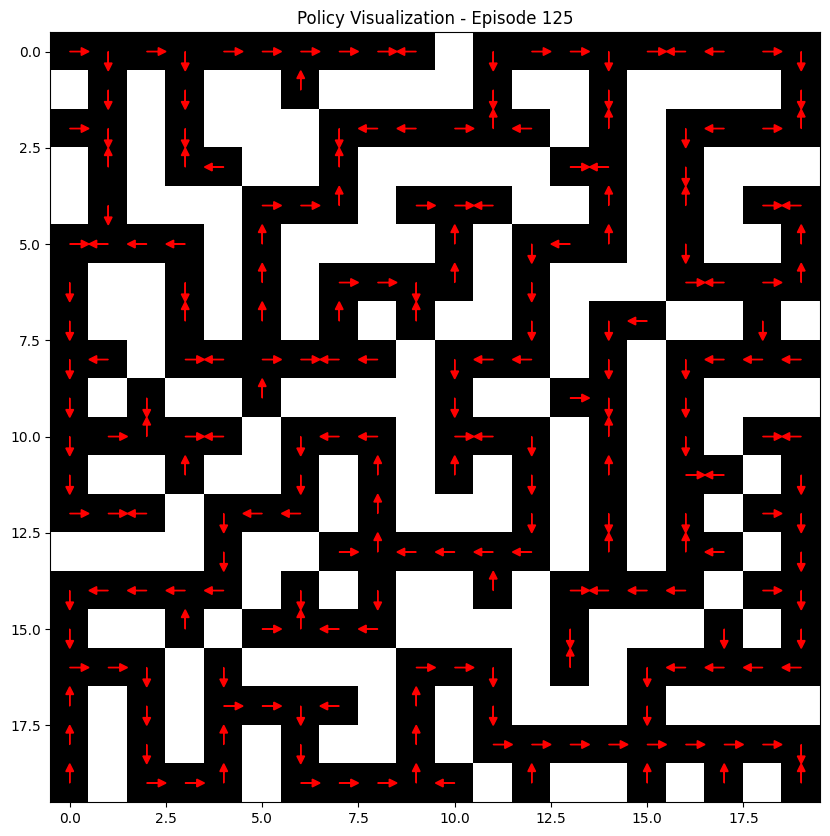

...

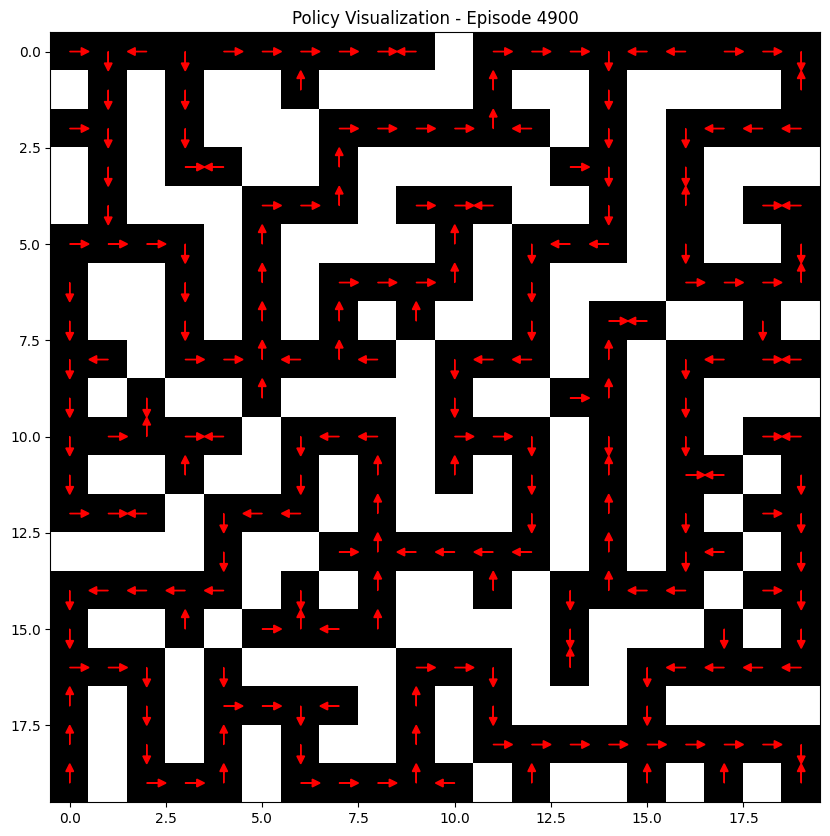

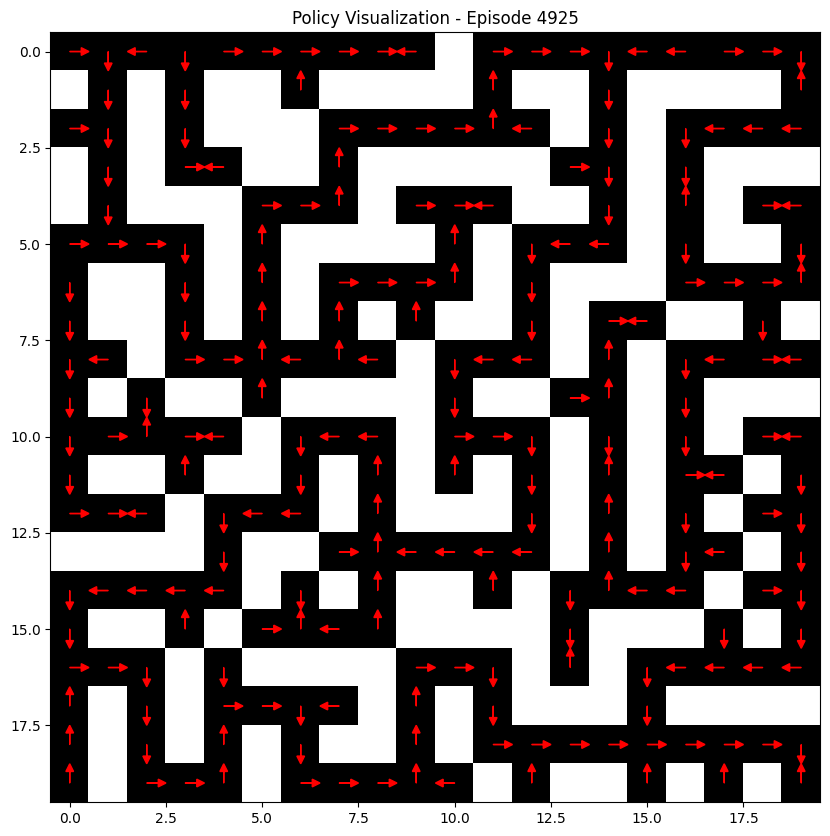

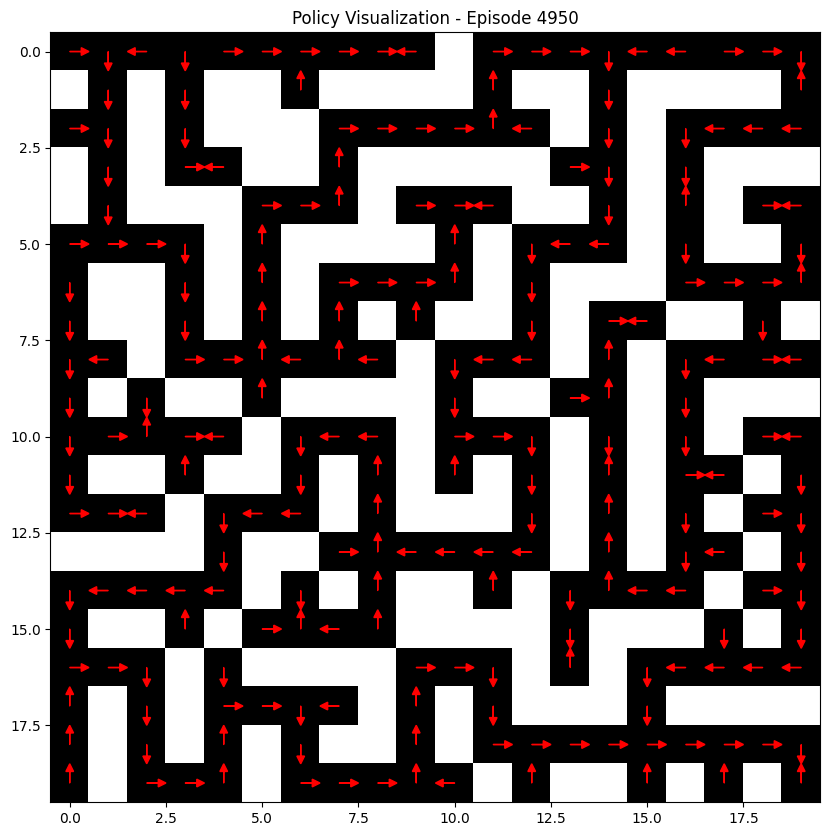

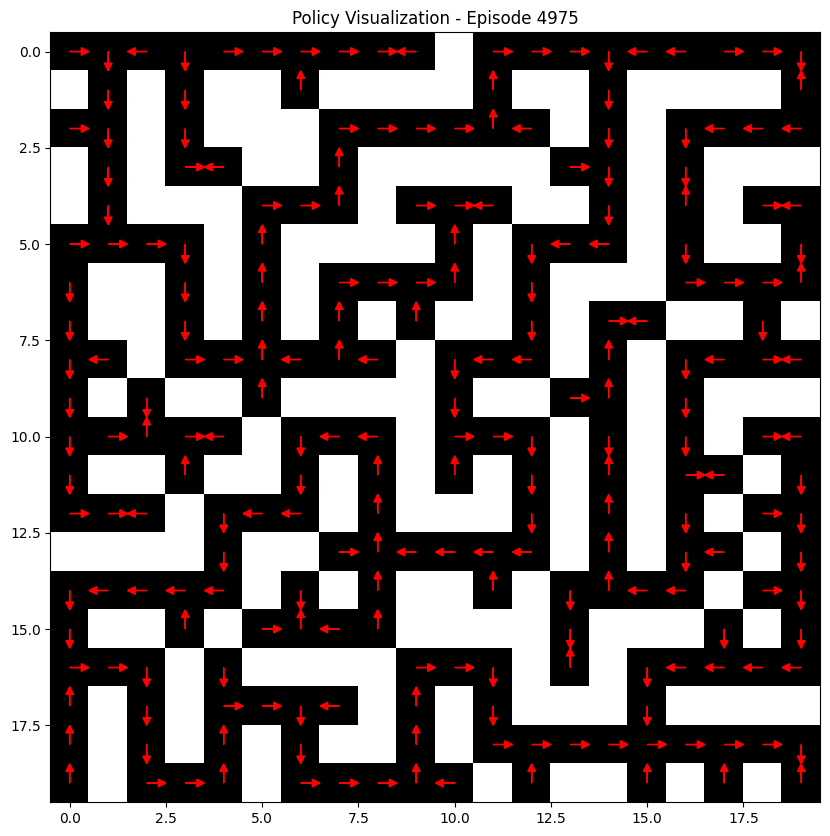

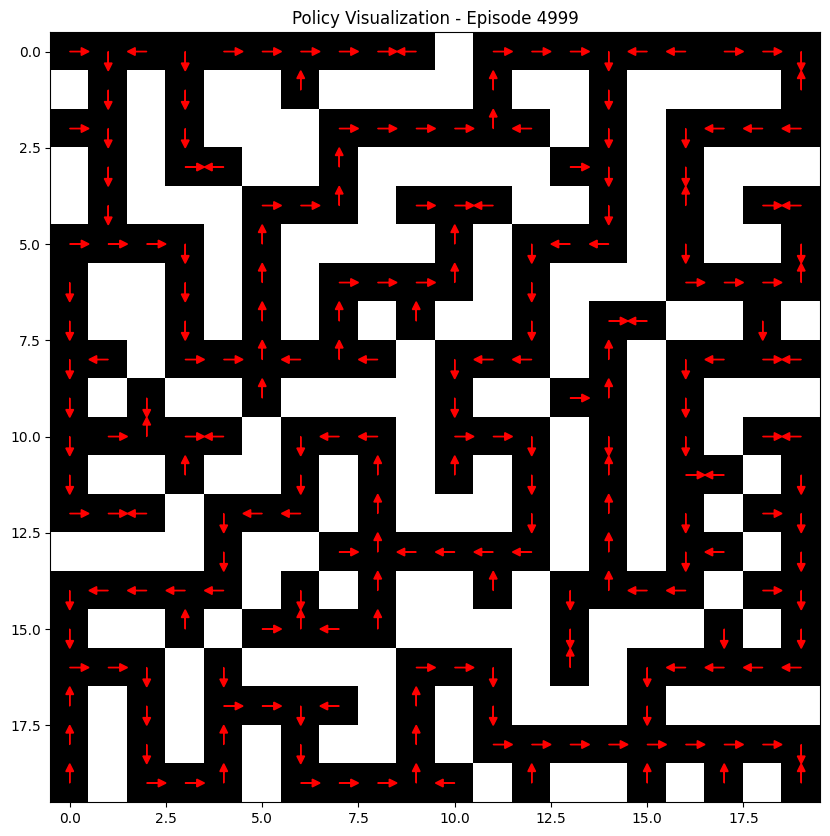

GIF saved as 'policy_evolution.gif'


In [19]:
import os

def train_agent_with_visualization(delay, d_episode):
    global epsilon
    frames = []  # List to store frames

    for episode in range(num_episodes):
        x, y = 0, 0  # Start position

        while (x, y) != (nx - 1, ny - 1):  
            action = choose_action(x, y)
            dx, dy = actions[action]
            new_x, new_y = x + dx, y + dy
            
            # Reward system
            if (new_x, new_y) == (nx - 1, ny - 1):
                reward = 100  
            else:
                reward = -1  
            
            # Q-value update
            best_next_action = max(get_valid_actions(new_x, new_y), key=lambda a: Q_table[new_y, new_x, a])
            Q_table[y, x, action] += alpha * (reward + gamma * Q_table[new_y, new_x, best_next_action] - Q_table[y, x, action])
            
            x, y = new_x, new_y

        # Decay epsilon
        epsilon = max(epsilon * epsilon_decay, epsilon_min)
        
        # Save policy visualization at key episodes
        if episode % d_episode == 0 or episode == num_episodes - 1:  # Save every 100 episodes
            save_path = f"policy_episode_{episode}.png"
            draw_policy(Q_table, episode, save_path)
            frames.append(imageio.imread(save_path))  # Store frame

    # Save GIF with longer duration between frames
    imageio.mimsave("policy_evolution.gif", frames, duration=delay)  # Increase duration to 1 second
    print("GIF saved as 'policy_evolution.gif'")
    
    for episode in range(0, num_episodes, d_episode):
        os.remove(f"policy_episode_{episode}.png")
        
# Train with visualization
train_agent_with_visualization(2.0,25)


